In [ ]:
!pip install scipy
!pip install matplotlib
!pip install pydmd
!pip install pykoopman
!pip install imageio
!pip install os
!pip install optht
!pip install derivative
!pip install lightning
!pip install imread
!pip install future
!pip install sphinx


import os
import matplotlib.pyplot as plt
import warnings
import scipy
import imageio
warnings.filterwarnings('ignore')

from pydmd import DMD
from matplotlib import animation
from IPython.display import HTML
import numpy as np
from os import listdir
import pykoopman as pk
import pandas as pd
from imread import imread

%matplotlib inline

import future
import sphinx

from sklearn.decomposition import PCA


from sklearn.preprocessing import StandardScaler
from pydmd import DMDc
from numpy.testing import assert_array_almost_equal

from numpy import linalg as LA
from pydmd import CDMD

from sklearn.datasets import fetch_openml
import sys
import cv2 as cv
import plotly.io as pio
import plotly.graph_objs as go
from PIL import Image
from skimage import color
from plotly import subplots
from sklearn.model_selection import train_test_split
pio.renderers.default = "colab"
from sklearn.decomposition import SparsePCA
import seaborn as sns

import time

from pydmd import HODMD
from pydmd.plotter import plot_eigs
import scipy
import scipy.integrate
from skimage.metrics import mean_squared_error as mse
from skimage.metrics import structural_similarity as ssim

In [ ]:
from pydmd import FbDMD

In [ ]:
IMG_DIR = '/content/images'
X = []
X_flat = []
count = 1
size1 = 137
size2 = 490
total = 560
print("Loading...")

# Define a function to extract the ending number from a filename
def get_file_number(filename):
    return int(''.join(filter(str.isdigit, filename)))

# Get a list of image files sorted by the ending number
sorted_images = sorted(os.listdir(IMG_DIR), key=get_file_number)

for img in sorted_images:
    if count == total + 1:
        break
    sys.stdout.write("\r" + str(count) + " / " + str(total))
    sys.stdout.flush()
    img_array = cv.imread(os.path.join(IMG_DIR, img), cv.IMREAD_GRAYSCALE,)
    img_pil = Image.fromarray(img_array)
    img_156x120 = np.array(img_pil.resize((size1, size2), Image.ANTIALIAS))
    X.append(img_156x120)
    img_array = img_156x120.flatten()
    X_flat.append(img_array)
    count += 1
print()
print("Done!")


Loading...
560 / 560
Done!


In [ ]:
X_flat = np.asarray(X_flat)
X_flat.shape

(560, 67130)

In [ ]:
velocity_magnitude_2D_array = X_flat.T
velocity_magnitude_2D_array.shape

(67130, 560)

In [ ]:
train = X_flat[:555,:]
train.shape

(555, 67130)

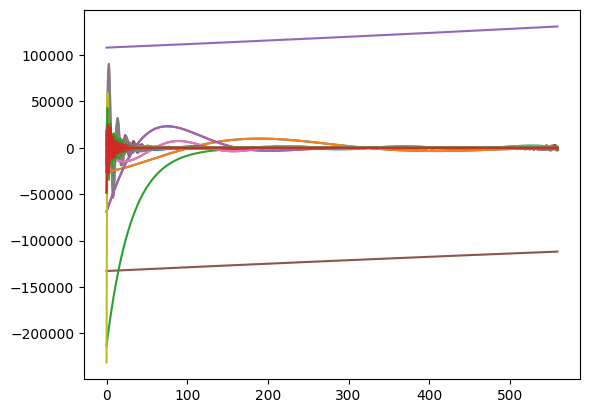

In [ ]:
dmd = DMD(svd_rank=555)
dmd.fit(train.T)
#fbdmd.dmd_time["dt"] *= 0.5
dmd.dmd_time["tend"] += 5

plt.plot(dmd.dmd_timesteps, dmd.dynamics.T.real)
plt.show()

In [ ]:
approximate = dmd.reconstructed_data
approximate = approximate.astype(np.float)
approximate.shape

(67130, 560)

In [ ]:
pca = PCA(0.90)
PC = pca.fit_transform(train)
eigenvalues = pca.explained_variance_
explained_variance_ratio = pca.explained_variance_ratio_

In [ ]:
PC.shape

(555, 15)

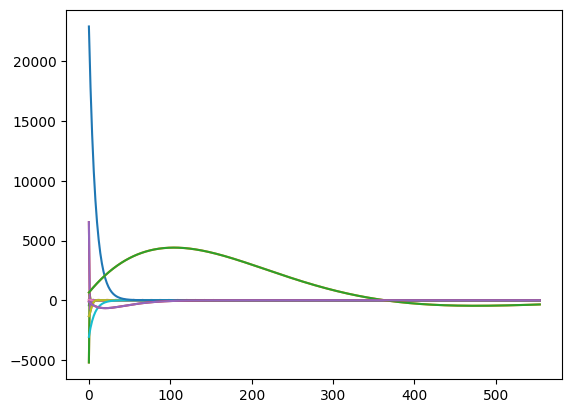

In [ ]:
dmdpca = DMD(svd_rank=15)
dmdpca.fit(PC.T)
#fbdmd.dmd_time["dt"] *= 0.5
#dmdpca.dmd_time["tend"] += 5

plt.plot(dmdpca.dmd_timesteps, dmdpca.dynamics.T.real)
plt.show()

In [ ]:
recon = pca.inverse_transform(dmdpca.reconstructed_data.T)
recon = recon.astype(np.float)
recon.shape

(555, 67130)

IndexError: ignored

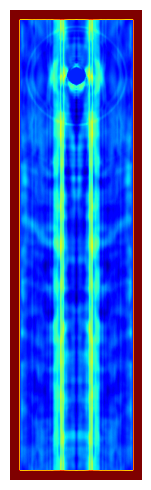

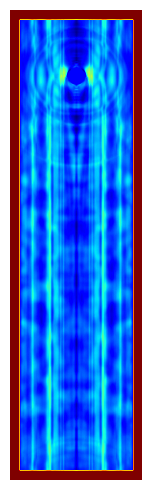

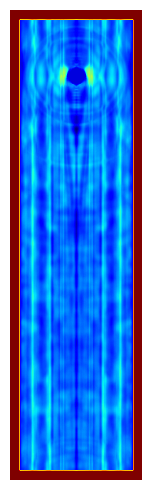

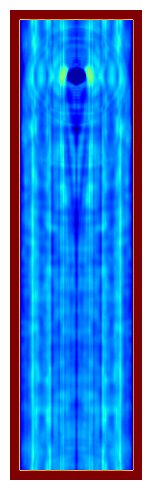

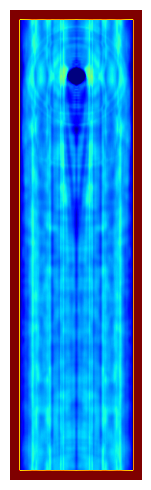

...

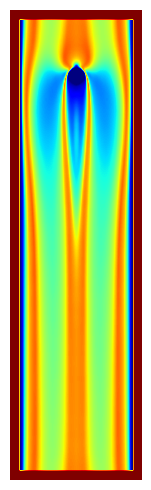

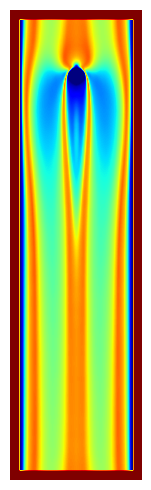

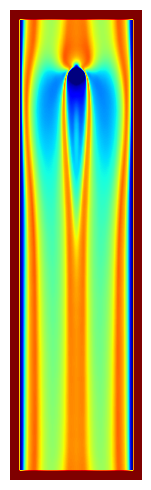

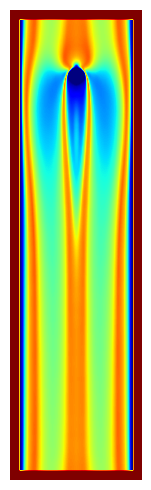

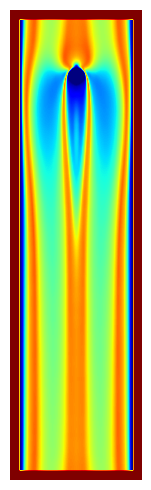

<Figure size 1000x500 with 0 Axes>

In [ ]:
i = 0
total = 560

for i in range(0, 560, 1):
    if i == total + 1:
       break
    images_dir = '/content/test'
    plt.figure(figsize=(10,5));
    plt.imshow(recon.T[:, i].reshape(490,137), cmap='jet');
    plt.axis('off');
    plt.tight_layout();
    plt.savefig(f"{images_dir}/label{[i]}.png", bbox_inches='tight')
    #plt.savefig('approximate[i].png')

In [ ]:
import shutil
shutil.make_archive('/content/DMD+PCA(99.0)_5F', 'zip', '/content/DMD+PCA(99.0)_5F')

'/content/DMD+PCA(99.0)_5F.zip'

In [ ]:
ssim_values = []
mse_values = []
i = 0
total = 560

for i in range(0, 560, 1):
    if i == total + 1:
       break
    ssim_value = ssim(X_flat[i].reshape(490,137), approximate[:, i].reshape(490,137))
    ssim_values.append(ssim_value)

    mse_value = mse(X_flat[i].reshape(490,137), approximate[:, i].reshape(490,137))
    mse_values.append(mse_value)

In [ ]:
ssim_values_pca = []
mse_values_pca = []
i = 0
total = 560

for i in range(0, 560, 1):
    if i == total + 1:
       break
    ssim_value = ssim(X_flat[i].reshape(490,137), recon[:, i].reshape(490,137))
    ssim_values_pca.append(ssim_value)

    mse_value = mse(X_flat[i].reshape(490,137), recon[:, i].reshape(490,137))
    mse_values_pca.append(mse_value)

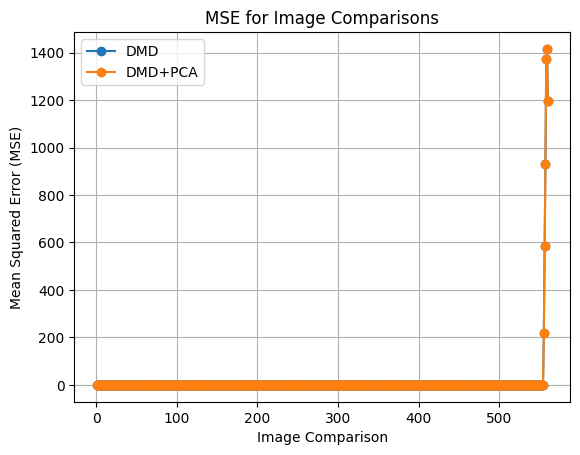

In [ ]:
plt.plot(range(1, total + 1), mse_values, marker='o', label='DMD')
plt.plot(range(1, total + 1), mse_values_pca, marker='o', label='DMD+PCA')
plt.xlabel("Image Comparison")
plt.ylabel("Mean Squared Error (MSE)")
plt.title("MSE for Image Comparisons")
plt.grid(True)
plt.legend()
plt.show()

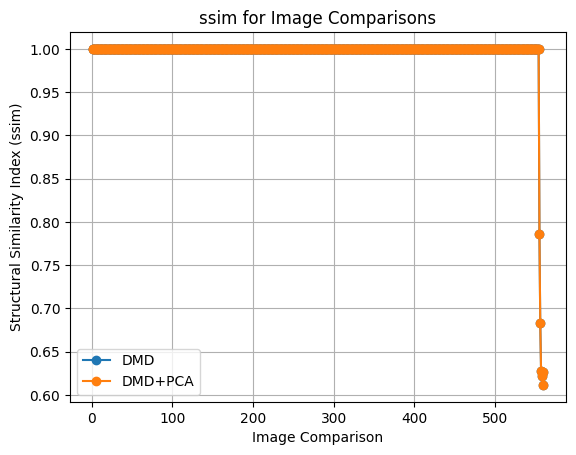

In [ ]:
plt.plot(range(1, total + 1), ssim_values, marker='o', label='DMD')
plt.plot(range(1, total + 1), ssim_values_pca, marker='o', label='DMD+PCA')
plt.xlabel("Image Comparison")
plt.ylabel("Structural Similarity Index (ssim)")
plt.title("ssim for Image Comparisons")
plt.grid(True)
plt.legend()
plt.show()